In [1]:
import os
import numpy as np
import pandas as pd
from sklearn.utils import shuffle
from sklearn.cross_validation import train_test_split
import matplotlib.pyplot as plt
#np.set_printoptions(threshold='nan')
from nolearn.lasagne import BatchIterator
#from lasagne import layers, nonlinearities
from nolearn.lasagne import NeuralNet
#import theano

Using gpu device 0: GeForce GTX 860M (CNMeM is disabled)


#### load images from csv (already preproc done)

In [2]:
#from sklearn import preprocessing
#from sklearn import decomposition

def load(fname='96x96_no_index_ear_roi.csv'):
    """
    """
    df = pd.read_csv(fname)
    df['Image'] = df['Image'].apply(lambda im: np.fromstring(str(im), sep=' '))
    df = df.dropna()  # drop all rows that have missing values in them
    X = np.vstack(df['Image'].values) / 255.  # scale pixel values to [0, 1]
    X = X.astype(np.float32)
    
    y = df[df.columns[:-1]].values
    y = (y - 48) / 48 # Use MinMax in refactor
    X, y = shuffle(X, y, random_state=42)
    y = y.astype(np.float32)

    return X, y

X, y = load()
X = X.reshape(-1, 1, 96, 96)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

print "X_train.shape == {}, X_test.shape == {} ".format(
    X_train.shape, X_test.shape)
print "y_train.shape == {}, y_test.shape == {} ".format(
    y_train.shape, y_test.shape)

X_train.shape == (2051, 1, 96, 96), X_test.shape == (684, 1, 96, 96) 
y_train.shape == (2051, 90), y_test.shape == (684, 90) 


In [3]:
def plot_sample(img, y, axis, move=48):
    axis.imshow(img, cmap='gray')
    axis.scatter(y[0::2] * move + move, y[1::2] * move + move, marker='x', s=5)

In [4]:
from nolearn.lasagne import BatchIterator
from random import randint
class FlipBatchIterator(BatchIterator):

    def transform(self, Xb, yb):
        Xb, yb = super(FlipBatchIterator, self).transform(Xb, yb)

        # Flip half of the images in this batch at random:
        bs = Xb.shape[0]
        indices = np.random.choice(bs, bs/2, replace=False) # /2 choose all
        Xb[indices] = Xb[indices, :, :, ::-1]

        if yb is not None:
            # Horizontal flip of all x coordinates:
            yb[indices, ::2] = yb[indices, ::2] * -1

        return Xb, yb

class AdjustVariable(object):
    def __init__(self, name, start=0.03, stop=0.001):
        self.name = name
        self.start, self.stop = start, stop
        self.ls = None

    def __call__(self, nn, train_history):
        if self.ls is None:
            self.ls = np.linspace(self.start, self.stop, nn.max_epochs)

        epoch = train_history[-1]['epoch']
        new_value = np.float32(self.ls[epoch - 1])
        getattr(nn, self.name).set_value(new_value)

#### Load the best three networks

In [19]:
import sys
sys.setrecursionlimit(100000)
import cPickle as pickle

fnames_nets = ['edp/small_learn_rate_08_oldschool4x3x3.pickle',
               'edp/small_learn_rate_08_3x2_deep_ear_roi.pickle',
               'edp/small_learn_rate_03_4x3_deep_ear_roi.pickle']
nets = [net0, net1, net2]
for n, fnames in enumerate(fnames_nets):
    with open(fnames, 'rb') as f:
        nets[n] = pickle.load(f)

#### Check structure of the best network *net0*

In [21]:
from nolearn.lasagne import PrintLayerInfo
layer_info = PrintLayerInfo()

nets[0].verbose = 3
nets[0].initialize()
layer_info(nets[0])


# Neural Network with 8622970 learnable parameters

## Layer information

name         size        total    cap.Y    cap.X    cov.Y    cov.X    filter Y    filter X    field Y    field X
-----------  --------  -------  -------  -------  -------  -------  ----------  ----------  ---------  ---------
input0       1x96x96      9216   100.00   100.00   100.00   100.00          96          96         96         96
conv2d1      32x93x93   276768   100.00   100.00     4.17     4.17           4           4          4          4
conv2d2      32x90x90   259200    57.14    57.14     7.29     7.29           4           4          7          7
maxpool2d3   32x45x45    64800    57.14    57.14     7.29     7.29           4           4          7          7
dropout4     32x45x45    64800   100.00   100.00   100.00   100.00          96          96         96         96
conv2d5      32x43x43    59168   100.00   100.00   100.00   100.00          96          96         96         96
conv2d6      32x41x41 

#### Loss plot of the three networks (valid and train)

In [22]:
from matplotlib import pyplot
import matplotlib.pyplot as plt

plt.clf()
plt.figure(figsize=(20,10))
for net, net_name, color in zip(nets, ['net0', 'net1', 'net2'], ['y', 'g', 'm']):
    train_loss = np.array([i["train_loss"] for i in net.train_history_])
    valid_loss = np.array([i["valid_loss"] for i in net.train_history_])
    pyplot.plot(train_loss[:1000], '--{}'.format(color), linewidth=2, label="{} train".format(net_name))
    pyplot.plot(valid_loss[:1000], '-{}'.format(color), linewidth=2, label="{} valid".format(net_name))

pyplot.grid()
pyplot.legend()
pyplot.xlabel("epoch")
pyplot.ylabel("loss")
#pyplot.ylim(1e-4, 1e-1)
pyplot.yscale("log")
pyplot.show()

#### Calculate several metrics from sklearn

In [23]:
from sklearn.metrics import mean_squared_error,  mean_absolute_error, explained_variance_score, r2_score
for net in nets:
    y_pred = net.predict(X_test)
    print np.sqrt(mean_squared_error(y_test, y_pred)) * 48
    print explained_variance_score(y_test.ravel(), y_pred.ravel())
    #print mean_absolute_error(y_test, y_pred) * 48
    print r2_score(y_test, y_pred) 
    print '+' * 10

2.2963321209
0.976649587974
0.709745817856
++++++++++
2.41548156738
0.974151836708
0.678843629052
++++++++++
2.33890378475
0.97576597333
0.69888404469
++++++++++


#### Predict landmarks over unseen images (test)

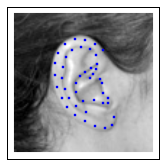

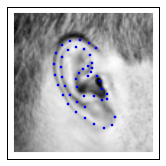

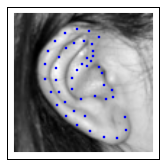

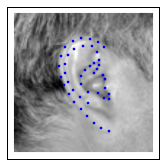

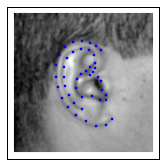

...

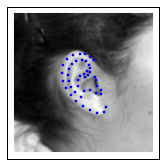

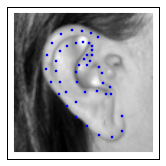

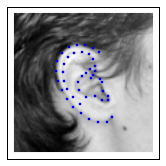

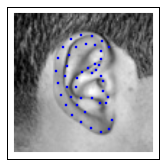

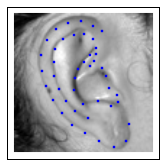

In [24]:
%matplotlib inline
y_pred = nets[0].predict(X_test)
for i in range(X_test.shape[0]):
    fig = plt.figure(figsize=(6, 3))
    ax = fig.add_subplot(1, 2, 1, xticks=[], yticks=[])
    img = X_test[i].reshape(96, 96)
    plot_sample(img, y_pred[i], ax)
    plt.savefig('/tmp/out_lateral_{}.png'.format(str(i)))
    plt.show()